# Practical 4 — Sequence-based spatial transcriptomics data analysis


**Course:** MGC-BioSB-Spatial-Omics-Analysis-2025  
**Session time:** 11/11/2025 13:15–14:45 (90 minutes)  
**Instructor:** Willem de Koning  
**Contact:** w.dekoning.1@erasmusmc.nl  
**Technical Assistant:** *Myrthe van Baardwijk*  

---
---

## 🧭 Overview

Sequencing-based spatial transcriptomics (SRT) combines **gene expression quantification** with **spatial localization**, allowing us to map transcripts directly in their native tissue context.

In this session, you will analyze a **Visium HD (8 µm) breast FFPE** dataset that has been preprocessed with **10x Space Ranger HD**, following a workflow similar to single-cell RNA-seq but specifically adapted to preserve **spatial context** and **tissue architecture**.

This practical is designed as a **hands-on complement** to the lecture *“Sequencing-based SRT and data preprocessing”*.  
In this session, you will perform each preprocessing step interactively, visualize spatial QC metrics, and interpret how they affect downstream biological insight.

---

## 🎯 Learning goals

1. **Load and explore Visium HD spatial data**  
   → Understand the structure of the Space Ranger output, load it into Python, and verify that tissue alignment and spatial coordinates are correct.

2. **Compute and interpret spatial QC metrics**  
   → Calculate and visualize total counts, detected genes, and percentage of mitochondrial reads (%MT) both as histograms and spatial maps.

3. **Filter low-quality bins carefully**  
   → Apply careful, spatially informed thresholds to remove technical noise while retaining biological signal.

4. **Normalize gene expression and select Highly Variable Genes (HVGs)**  
   → Perform count normalization and log transformation, explore mean–variance relationships, and identify biologically informative genes.

5. **Reduce dimensionality and explore structure (PCA & embedding)**  
   → Use PCA to summarize gene-expression variation, and build a quick illustrative UMAP + Leiden clustering to visualize spatial domains.

---

## 💡 Why this matters

In sequencing-based spatial transcriptomics (SRT), we perform steps familiar from single-cell RNA-seq – **Quality control → Normalization → Feature selection → Dimensionality reduction** – but the **spatial context** changes how we interpret and apply them.

Unlike dissociated scRNA-seq:
- **Low-count regions** may represent real biology (e.g. sparse stroma, necrotic areas), not poor quality.  
- **High mitochondrial percentages** can reflect tissue composition or metabolic state.  
- **Filtering decisions** must consider both the data *and* the tissue image.

This practical will teach you to **combine quantitative QC plots with visual inspection** to make biologically aware choices, avoiding the loss of meaningful spatial regions while maintaining data integrity for downstream analysis.

> 🧭 The goal is not just to “clean” the data, but to **understand what quality means in a spatial context**.

---

## 🧬 Biological context — the Visium HD breast tissue sample — (square_008um)

The dataset used in this practical is the **Visium HD Breast Cancer** demo dataset from 10x Genomics, specifically the **square_008um** binning level.  
This means each expression bin represents a **square area of 8 µm × 8 µm** on the tissue section, providing near single-cell spatial resolution.

🔗 **[10x Genomics – Visium HD CytAssist Gene Expression (Human Breast Cancer FFPE)](https://www.10xgenomics.com/datasets/visium-hd-cytassist-gene-expression-libraries-human-breast-cancer-ffpe-if)**

This human breast tissue section includes both **cancerous epithelial structures** and **stromal components** such as adipose tissue and connective regions.  
Key biological and spatial features:

- **Tumor heterogeneity:** malignant epithelial cells intermixed with stromal fibroblasts and immune cells.  
- **Distinct metabolic zones:** mitochondrial gene expression and total UMI counts can differ between tumor core and stroma.  
- **Histological diversity:** regions rich in ducts, necrotic tissue, or background may exhibit lower capture efficiency.  

### Sample information

The **Visium HD Breast Cancer (square_008um)** dataset features a formalin-fixed, paraffin-embedded (FFPE) tissue section from a human female breast cancer case, specifically ductal carcinoma in situ. The sample was sourced from Avaden Biosciences and has a reported quality of 37.2 DV200.

**Preparation & Imaging**
- 5 µm FFPE tissue section prepared according to the *Visium HD FFPE Tissue Preparation Handbook (CG000684)*.  
- Stained using **immunofluorescence (IF)**:
  - **CD45RO (Alexa 594)** → T cells and immune infiltrate  
  - **CD20 (Alexa 488)** → B cells  
  - **DAPI** → nuclei counterstain  
- Imaged using the **Visium CytAssist** platform with a 20× objective prior to spatial transcriptome capture.

**Molecular assay**
- Processed with the **Visium HD Spatial Gene Expression Reagent Kit (CG000685)**  
  and **Visium Human Transcriptome Probe Set v2.0**.  
- Sequenced on an **Illumina NovaSeq 6000** (~ 360 million reads, paired-end).  
- Data processed using **Space Ranger v3.1.2**, which generated the gene × barcode matrix and spatial coordinates.

These details are useful for interpreting the biological and technical variation we’ll see during QC:
- Regions high in **CD45RO/CD20** signal correspond to **immune infiltration**.  
- Differences in **library size** or **mitochondrial percentage** across the slide can reflect both **cell-type composition** and **tissue processing effects** (e.g., FFPE degradation or permeabilization).

---

## 🧫 From sequencing to spatial transcriptomics data

Before diving into the analysis, let’s recall how sequencing-based SRT data are generated and processed.  
*(See the lecture slides: “Sequencing-based SRT” and “Preprocessing SRT data”.)*  

### What is **Space Ranger** (and how it relates to **Cell Ranger**)?

- **Cell Ranger** is 10x Genomics’ software for **single-cell RNA-seq** data processing.  
- **Space Ranger** is the corresponding pipeline for **spatial transcriptomics** with **Visium** and **Visium HD** assays.  
- Both perform similar steps:  
  1. **Read alignment** to a reference genome or transcriptome.  
  2. **Barcode and UMI processing** — assigning reads to barcodes (spots/bins) and collapsing UMIs.  
  3. **Count matrix generation** — creating the gene × barcode matrix that we use in Python tools like Scanpy.  
- For **Visium HD**, Space Ranger also **maps each barcode/bin to its exact position on the H&E image** (via CytAssist registration).  
  These coordinates allow spatial visualization and tissue-context analysis.

### Dataset: Space Ranger output (input for our practical)

A processed **Space Ranger Output** archive typically contains:

```
├── filtered_feature_bc_matrix.h5     # genes × barcodes count matrix
├── spatial/
│   ├── scalefactors_json.json        # pixel scaling & spot-size info
│   ├── tissue_positions.parquet      # barcode coordinates (pixels)
│   ├── tissue_hires_image.png        # high-resolution H&E image
│   └── tissue_lowres_image.png       # low-resolution image for plotting
```

These files define both the **expression data** and the **spatial layout** of the Visium HD slide.  
We will **not rerun Space Ranger**, but instead analyze the processed output in Python using **Scanpy** and **Squidpy**.

We’ll start by loading this output into Python and verifying that tissue alignment and bin coordinates are correct (**Part 1**).

<div style="border: 2px solid #e07a7a; border-radius: 8px; padding: 12px; background-color: #fffafa;">

### 🧠 Reflection (before you start)

**Q1.** Why is a **visual inspection** of the H&E image useful *before* running QC?  
<details>
<summary>💬 Click to reveal the answer</summary>

Visual inspection confirms tissue integrity, correct orientation, and identifies damaged, folded, or empty areas.  
This ensures that apparent low-quality regions in QC plots are interpreted correctly — e.g., distinguishing real biological sparsity from technical artifacts.
</details>

---

**Q2.** Which QC signals (total counts, genes detected, %MT) might reflect **biology** rather than **technical noise**?  
<details>
<summary>💬 Click to reveal the answer</summary>

- **Total counts / detected genes** can vary with tissue density — tumor versus stroma differences are expected.  
- **% mitochondrial reads** may reflect metabolic differences rather than poor data quality.  
Thus, QC thresholds should be interpreted in *spatial context*, not applied uniformly across the tissue.
</details>

</div>

---


## 🧩 Part 1 — Load and explore Visium HD spatial data

*Learning goal:* Understand the structure of the Space Ranger output, load it into Python, and verify that tissue alignment and spatial coordinates are correct.

---

### Overview

In this first step, we will:  
  1. Import and configure the required Python packages.  
  2. Load the **Visium HD Breast (8 µm)** dataset preprocessed with 10x **Space Ranger HD**.  
  3. Verify that the expression matrix and spatial image are correctly linked and ensure data integrity.  
  4. Visually inspect the tissue alignment before running any QC.

---

### Environment setup

We begin by importing the core libraries **Scanpy** and **Squidpy**, along with the standard scientific Python stack (*NumPy*, *Pandas*, *Matplotlib*, *Seaborn*).  
We then confirm that the environment versions are correct.

> 🧰 *This ensures reproducibility and avoids version-specific differences during visualization or normalization.*

In [1]:
# --- Environment setup and reproducibility ---
import warnings
warnings.filterwarnings("ignore")  # hide non-critical future/deprecation warnings

# Core libraries
from pathlib import Path
import importlib.metadata as im
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Spatial transcriptomics packages
import scanpy as sc
import squidpy as sq

# --- Version info ---
def pkg_version(pkg):
    """Return installed package version (or 'not installed' if missing)."""
    try:
        return im.version(pkg)
    except im.PackageNotFoundError:
        return "not installed"

import sys
print(f"Python version: {sys.version.split()[0]}")
print(f"Scanpy version: {pkg_version('scanpy')}")
print(f"Squidpy version: {pkg_version('squidpy')}")

# --- Visualization defaults (for consistent plotting) ---
sc.set_figure_params(figsize=(5, 5), dpi=100)
plt.rcParams["axes.grid"] = False

# --- Confirm environment ---
print("Environment ready ✅")

Python version: 3.10.19
Scanpy version: 1.11.5
Squidpy version: 1.6.5
Environment ready ✅


### Load the Visium HD dataset

We now load the **Visium HD Breast (8 µm)** dataset from the local `data/` directory.  
The function `squidpy.read.visium()` automatically reads the **gene × barcode matrix** into an **AnnData** object and links it to the spatial metadata and histology image.

> 💡 The `data/` folder corresponds to your **Space Ranger output directory**.  
> We analyze the processed output rather than raw FASTQ files — alignment and registration have already been completed by Space Ranger.

In [2]:
# --- Load Visium HD dataset ---
# Note: Compatible with Squidpy ≥ 1.3 for Visium HD format

# Define input directories (as in the Space Ranger output structure)
DATA_DIR = Path("data")           # main folder with filtered_feature_bc_matrix.h5
IMAGE_DIR = DATA_DIR / "spatial"  # folder with histology images

# Read Space Ranger output and link expression data with spatial coordinates and histology image
adata = sq.read.visium(path=DATA_DIR, load_images=True, source_image_path=IMAGE_DIR)

# Make gene names unique and store a dataset label for use in plot titles
adata.var_names_make_unique()
adata.uns["dataset_name"] = "Visium HD Breast (8 µm bins)"

# Summarize the dataset
n_bins, n_genes = adata.shape
img_keys = list(adata.uns.get("spatial", {}).keys()) or "None"

print(f"✅ Data successfully loaded: {adata.uns['dataset_name']}")
print(f"   Bins (spots): {n_bins:,}")
print(f"   Genes: {n_genes:,}")
print(f"   Available image keys: {img_keys}")

✅ Data successfully loaded: Visium HD Breast (8 µm bins)
   Bins (spots): 663,857
   Genes: 18,085
   Available image keys: ['Visium_HD_Human_Breast_Cancer_FFPE']


### Spatial alignment and inspection

Visium HD data requires precise registration of the tissue image to the **capture area** containing the spatial barcodes.  
This alignment is performed automatically by **Space Ranger** during image processing, and the results are saved in the `spatial/` folder.

We can confirm this alignment visually by displaying the **fiducial frame (alignment markers)** and **detected tissue mask** images produced by Space Ranger.

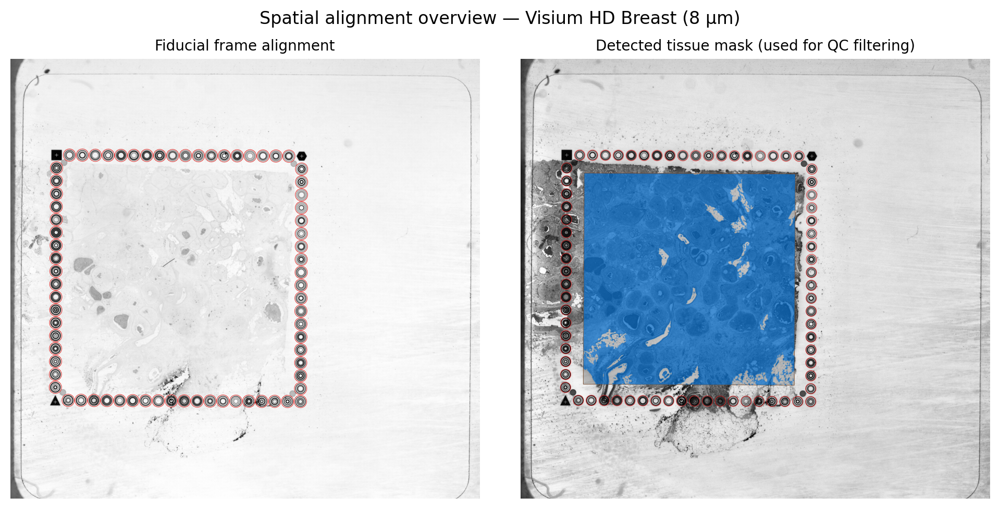

In [3]:
# --- Show spatial alignment and tissue detection images ---
# Display Space Ranger alignment QC outputs to confirm tissue registration

spatial_dir = DATA_DIR / "spatial"

# Define which Space Ranger QC images to display
img_files = [
    ("aligned_fiducials.jpg", "Fiducial frame alignment"),
    ("detected_tissue_image.jpg", "Detected tissue mask (used for QC filtering)")
]

# Display both images side by side
fig, axes = plt.subplots(1, len(img_files), figsize=(10, 5))

# Loop over defined images and display them (show a message if missing)
for ax, (fname, title) in zip(axes, img_files):
    path = spatial_dir / fname
    if path.exists():
        img = Image.open(path)
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(title, fontsize=10)
    else:
        ax.text(0.5, 0.5, f"{fname} not found", ha="center", va="center", color="red", fontsize=9)

# Add a common title and display the figure
plt.suptitle("Spatial alignment overview — Visium HD Breast (8 µm)", fontsize=12)
plt.tight_layout()
plt.show()

### Visual check — tissue and spatial bin alignment

Before running QC, always confirm that the tissue and spatial bins align correctly,  
because this verifies that barcode coordinates and the histology image are properly registered.

> 🔄 *Note:* The image may appear flipped relative to the raw `.jpg` file.  
> This is expected — **Scanpy** and **Squidpy** convert from **image coordinates** (origin = top-left)  
> to **slide coordinates** (origin = bottom-left) to match the tissue’s physical layout.

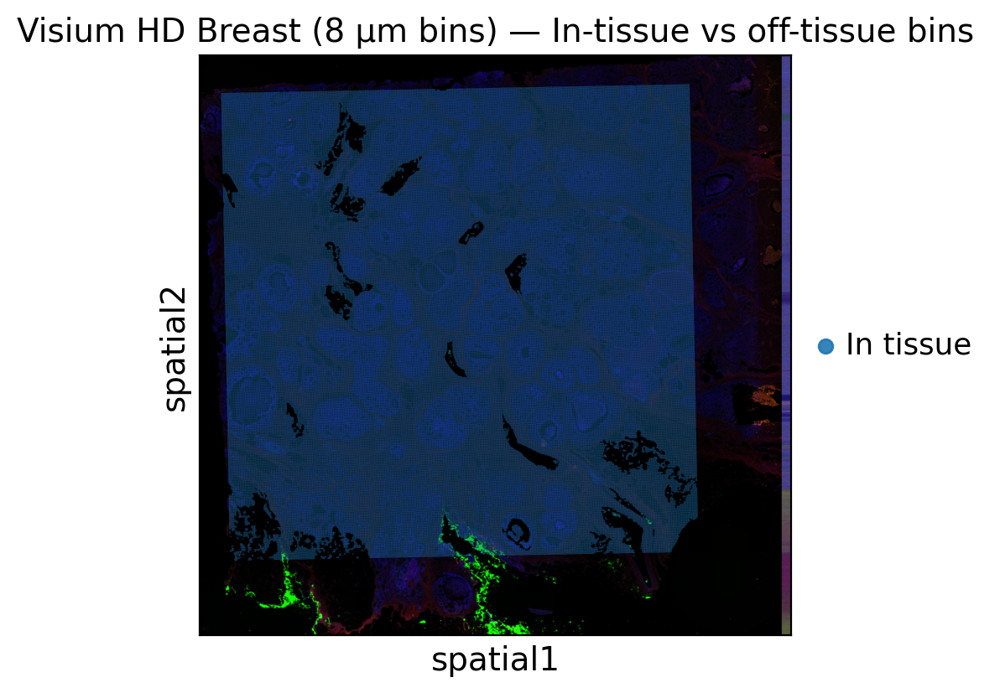

In [4]:
# --- Visualize all bins: in-tissue vs off-tissue ---
# Overlay barcode bins on the tissue image to confirm alignment

if "in_tissue" in adata.obs:
    # Convert binary tissue flag (0/1) to readable category labels
    adata.obs["in_tissue"] = adata.obs["in_tissue"].map({0: "Off tissue", 1: "In tissue"}).astype("category")

sq.pl.spatial_scatter(
    adata,
    color="in_tissue",
    img=True,
    size=0.8,
    alpha=0.9,
    title=f"{adata.uns.get('dataset_name', 'Dataset')} — In-tissue vs off-tissue bins"
)

<div style="border: 2px solid #e07a7a; border-radius: 8px; padding: 12px; background-color: #fffafa;">

#### 🧠 Reflection — Loading and exploring the dataset

**Q1.** How do you know the **spatial alignment** is already complete for this dataset?  
<details>
<summary>💬 Click to reveal answer</summary>

Because the barcode coordinates (from `tissue_positions.csv`) are already linked to the histology image  
by **Space Ranger HD** during preprocessing. We can directly overlay the bin coordinates on the aligned image  
— no manual registration is needed in this notebook.  
In a full workflow, you would normally inspect this alignment in **Loupe Browser**,  
but for this demo it’s already verified.
</details>

---

**Q2.** Why do we only see **“In tissue”** bins in this dataset?  
<details>
<summary>💬 Click to reveal answer</summary>

Because we loaded the **filtered** matrix (`filtered_feature_bc_matrix.h5`),  
which includes only barcodes located **inside** the tissue mask.  
**Off-tissue** bins were already excluded by **Space Ranger HD** during processing.  
This is expected and makes downstream QC simpler.
</details>

</div>


## 🧮 Part 2 — Compute and interpret spatial QC metrics  

*Learning goal:* Calculate and visualize total counts, detected genes, and % mitochondrial reads both as histograms and spatial maps.

---

### Overview

Now that the Visium HD dataset is loaded and aligned, we perform **quality control (QC)** to assess data completeness and technical variation.  
These metrics help distinguish biologically meaningful differences (e.g., dense tumor regions vs. sparse stroma) from technical artifacts.

In this part, we will:  
1. **Compute** standard QC metrics per spatial bin.  
2. **Visualize** their distributions as histograms.  
3. **Interpret** their biological meaning in spatial context.  

> 💡 *Because this is an FFPE 8 µm dataset, expression is sparse; interpret QC metrics carefully rather than applying harsh cut-offs.*

---

### Compute QC metrics

Before filtering, we first **quantify data quality** for each spatial bin.  
In sequencing-based SRT, QC metrics capture both the **quantity** and **quality** of RNA detected across the slide.

We focus on three key measures:

| Metric | What it measures | Why it matters |
|:--|:--|:--|
| **`total_counts`** | Total number of detected transcripts (UMIs) per bin | Reflects RNA capture efficiency; very low values indicate background or damaged tissue. |
| **`n_genes_by_counts`** | Number of different genes detected per bin | Reflects library complexity — bins with few detected genes usually have poor capture efficiency. |
| **`pct_counts_mt`** | Percentage of mitochondrial transcripts (*MT-* genes) | May indicate RNA degradation or cell damage; however, in FFPE Visium HD data these values are typically low but can vary with tissue composition. |

> 🧰 *Together, these metrics capture both the **quantity** and **quality** of RNA per bin.  
> We compute them below using **Scanpy’s built-in QC functions**:*

In [5]:
# --- Compute QC metrics ---

# Identify mitochondrial genes (important for QC metric: % mitochondrial reads)
# Look for column naming conventions depending on how the dataset was processed
if "gene_symbols" in adata.var.columns:
    symbols = adata.var["gene_symbols"].astype(str)
elif "gene_symbol" in adata.var.columns:
    symbols = adata.var["gene_symbol"].astype(str)
elif "feature_name" in adata.var.columns:
    symbols = adata.var["feature_name"].astype(str)
else:
    symbols = adata.var_names.astype(str)

# Mark mitochondrial genes (start with "MT-")
adata.var["mt"] = np.array(pd.Series(symbols).str.upper().str.startswith("MT-"))

# --- Calculate QC metrics (adds: total_counts, n_genes_by_counts, pct_counts_mt) ---
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt"],
    percent_top=None,
    log1p=False,   # Use raw counts (no log transform) for QC summaries
    inplace=True
)

# --- Preview first few rows to confirm metrics ---
adata.obs[["total_counts", "n_genes_by_counts", "pct_counts_mt"]].head()

,total_counts,n_genes_by_counts,pct_counts_mt
s_008um_00269_00526-1,214.0,195,4.672897
s_008um_00260_00253-1,189.0,170,2.116402
s_008um_00433_00599-1,13.0,12,0.000000
s_008um_00266_00304-1,122.0,102,3.278688
s_008um_00154_00449-1,145.0,129,2.758621


### Explore QC distributions

Let’s visualize the **distributions** of each QC metric to understand data range and detect potential outliers.  
These histograms typically show a large group of tissue bins with moderate values,  
a low-count tail representing background, and rare bins with elevated mitochondrial percentages.  

> 🧩 *Histograms summarize overall quality but not spatial organization — we’ll map those next.*

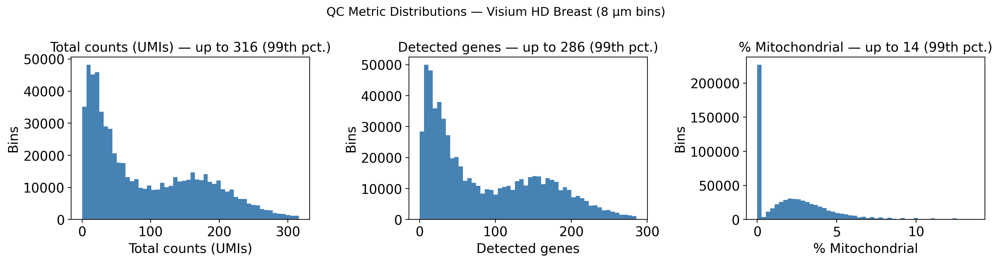

In [6]:
# --- Plot QC metric histograms ---

# Helper for dynamic x-axis limits (99th percentile cutoff)
def get_limit(values, percentile=99):
    """Return the percentile-based max value, ignoring NaNs."""
    values = pd.Series(values).dropna()
    return np.nanpercentile(values, percentile) if len(values) > 0 else None

# --- Prepare figure ---
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
metrics = [
    ("total_counts", "Total counts (UMIs)"),
    ("n_genes_by_counts", "Detected genes"),
    ("pct_counts_mt", "% Mitochondrial"),
]

# --- Draw histograms for each QC metric ---
for ax, (col, label) in zip(axes, metrics):
    if col not in adata.obs:
        ax.set_visible(False)
        continue
    vals = adata.obs[col].astype(float)
    vmax = get_limit(vals, 99)
    if vmax:
        vals = vals[vals <= vmax]
    ax.hist(vals, bins=50, color="steelblue", edgecolor="none")
    ax.set_title(f"{label} — up to {vmax:.0f} (99th pct.)")
    ax.set_xlabel(label)
    ax.set_ylabel("Bins")

plt.suptitle("QC Metric Distributions — Visium HD Breast (8 µm bins)", fontsize=13)
plt.tight_layout()
plt.show()

### Interpreting QC distributions

- **Total counts (UMIs):** very low values likely reflect empty background bins.  
- **Detected genes:** low values suggest poor RNA capture or damaged tissue.  
- **% Mitochondrial:** typically low for FFPE data but can flag degradation.

---

### Setting thresholds

For this high-resolution (8 µm) dataset, apply **gentle cut-offs** — remove obvious noise without losing signal.

| Metric | What to remove | Example threshold |
|:--|:--|:--|
| `total_counts` | Background or empty regions | ≥ 10 UMIs |
| `n_genes_by_counts` | Bins with few detected genes | ≥ 10 genes |
| `pct_counts_mt` | Excessive mitochondrial content (if relevant) | ≤ 5 % |

> 💬 *These are suggested starting points — always check your histograms and spatial maps before finalizing thresholds.*

---

<div style="border: 2px solid #e07a7a; border-radius: 8px; padding: 12px; background-color: #fffafa;">

### 🧠 Reflection — Interpreting QC plots

**Q1.** Where would you draw the line between “signal” and “noise”?  
<details><summary>💬 Click to reveal answer</summary>
At the point where the near-zero background tail drops off and the main tissue distribution begins.
</details>

---

**Q2.** Why do we filter only *low-count* bins in spatial data, but both low and high counts in scRNA-seq?  
<details><summary>💬 Click to reveal answer</summary>
High-count bins often represent dense epithelium or tumor regions — real biology, not doublets.  
We remove only low-quality bins to preserve tissue structure.
</details>

---

**Q3.** How might overly strict filtering bias downstream analysis?  
<details><summary>💬 Click to reveal answer</summary>
It can remove biologically relevant low-expression areas (e.g. stroma or necrosis), distorting spatial context and cluster composition.
</details>

</div>


## 🧹 Part 3 — Filter low-quality bins carefully  

*Learning goal*: Apply gentle, spatially informed thresholds to retain biological signal while removing technical background.

---

### Overview

After interpreting QC metrics, we now filter out technical background while preserving real biological regions.  
In spatial transcriptomics, filtering must be **context-aware** — too strict and we lose signal, too lenient and we retain noise.

In this part, we will:  
  1. Apply thresholds based on QC metrics.  
  2. Visualize pass/fail results spatially.  
  3. Generate a filtered object for downstream analysis.  

We’ll first define the threshold values and then apply them programmatically.

We start by defining gentle thresholds to remove clear background bins while preserving tissue signal.  
These can be tuned based on the histograms from Part 2.


In [7]:
# --- Define gentle QC thresholds ---

# Use gentle, rounded values suitable for FFPE / Visium HD data
LIB_MIN   = 10.0   # total_counts >= 10 UMIs
GENES_MIN = 10.0   # n_genes_by_counts >= 10 genes
MT_MAX    = 5.0    # pct_counts_mt <= 5%  (set only if mito is informative)

# --- Display chosen thresholds ---
print("Using thresholds:")
print(f"  total_counts       ≥ {LIB_MIN}")
print(f"  n_genes_by_counts  ≥ {GENES_MIN}")
print(f"  pct_counts_mt      ≤ {MT_MAX}%  (ignored if mito% not informative)")


Using thresholds:
  total_counts       ≥ 10.0
  n_genes_by_counts  ≥ 10.0
  pct_counts_mt      ≤ 5.0%  (ignored if mito% not informative)


We now compute **pass/fail masks** per metric and an overall **keep** mask that retains bins passing all active criteria.

In [8]:
# --- Build pass/fail masks (aligned, gentle thresholds) ---

# Library size & detected genes
lib_pass   = adata.obs["total_counts"] >= LIB_MIN
genes_pass = adata.obs["n_genes_by_counts"] >= GENES_MIN

# Mitochondrial percentage (may be uninformative in FFPE)
pct = adata.obs.get("pct_counts_mt", pd.Series(np.nan, index=adata.obs.index)).astype(float)
mt_informative = pct.notna().any()
mt_pass = (pct <= MT_MAX) if mt_informative else pd.Series(True, index=adata.obs.index)

# --- Helper to store readable categorical status columns ---
def add_status(colname, mask_pass, pass_label, fail_label):
    labels = np.where(mask_pass, pass_label, fail_label)
    adata.obs[colname] = pd.Categorical(labels, categories=[fail_label, pass_label], ordered=True)
    return colname

qc_lib     = add_status("qc_lib",   lib_pass,   "Pass (library)", f"Low library < {LIB_MIN:,.0f}")
qc_genes   = add_status("qc_genes", genes_pass, "Pass (genes)",   f"Low genes < {GENES_MIN:,.0f}")
qc_mito    = add_status("qc_mito",  mt_pass,    "Pass (mito%)",   f"High mito > {MT_MAX:.1f}%")

# Overall keep mask (AND of all active criteria)
keep_mask  = lib_pass & genes_pass & mt_pass
qc_overall = add_status("qc_overall", keep_mask, "Pass all", "Fail any")

# --- QC summary ---
n = adata.n_obs
print("QC summary:")
print(f"  Library   : keep {lib_pass.sum():,}/{n:,} ({100*lib_pass.mean():.1f}%)")
print(f"  Genes     : keep {genes_pass.sum():,}/{n:,} ({100*genes_pass.mean():.1f}%)")
if mt_informative:
    print(f"  Mito %    : keep {mt_pass.sum():,}/{n:,} ({100*mt_pass.mean():.1f}%)")
else:
    print("  Mito %    : skipped (not informative in this FFPE dataset)")
print(f"  OVERALL   : keep {keep_mask.sum():,}/{n:,} ({100*keep_mask.mean():.1f}%)")

QC summary:
  Library   : keep 604,835/663,857 (91.1%)
  Genes     : keep 602,675/663,857 (90.8%)
  Mito %    : keep 588,919/663,857 (88.7%)
  OVERALL   : keep 536,626/663,857 (80.8%)


This summary shows how many bins pass each criterion.  
Most bins pass — typical for Visium HD when cut-offs are set conservatively.  
If mitochondrial percentage is not informative in FFPE, it is skipped in the overall decision.

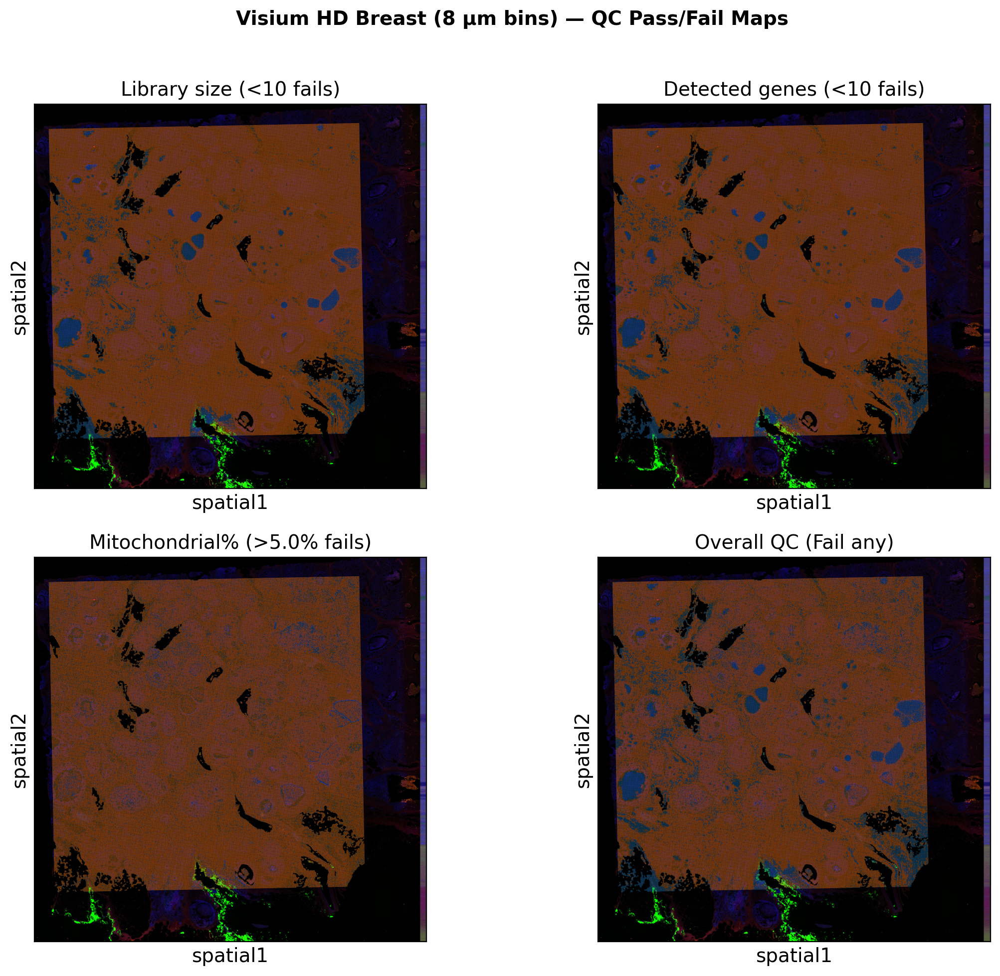


Created `adata_filt` with 536,626 bins for downstream steps.


In [9]:
# --- Panels to plot ---
qc_panels = [
    ("qc_lib",   f"Library size (<{LIB_MIN:,.0f} fails)"),
    ("qc_genes", f"Detected genes (<{GENES_MIN:,.0f} fails)"),
    ("qc_mito",  f"Mitochondrial% (>{MT_MAX:.1f}% fails)" if mt_informative else "Mitochondrial% (not informative)"),
    ("qc_overall", "Overall QC (Fail any)"),
]

# --- 2×2 figure ---
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
for ax, (col, title) in zip(axes.flatten(), qc_panels):
    if col in adata.obs:
        sq.pl.spatial_scatter(
            adata,
            color=col,
            img=True,
            size=0.8,
            alpha=0.9,
            legend_loc=None,
            ax=ax,
            title=title,
        )
    else:
        ax.axis("off")

plt.suptitle(f"{adata.uns.get('dataset_name','Dataset')} — QC Pass/Fail Maps", fontsize=14, weight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# --- Filtered object for downstream steps ---
adata_filt = adata[keep_mask].copy()
print(f"\nCreated `adata_filt` with {adata_filt.n_obs:,} bins for downstream steps.")

These spatial maps show **where** low-quality bins cluster — typically at tissue edges or damaged/low-capture areas.  
`adata_filt` now contains only high-quality bins, ready for **normalization** and **feature selection**.

<div style="border: 2px solid #e07a7a; border-radius: 8px; padding: 12px; background-color:#fffafa;">

#### 🧠 Reflection — Spatial QC patterns

**Q1.** Did low-quality bins cluster spatially? Why?  
<details><summary>💬 Click to reveal answer</summary>
Often at edges or low-capture regions (e.g., tears, folds, sparse stroma).  
Sometimes patterns reflect real biology (stroma vs. epithelium), so avoid over-filtering.
</details>

---

**Q2.** What changed after filtering?  
<details><summary>💬 Click to reveal answer</summary>
Maps become cleaner and more uniform; background noise is reduced, improving downstream clustering and differential expression (DE) analyses.
</details>

</div>

## 🧪 Part 4 — Normalize gene expression and select Highly Variable Genes (HVGs)

*Learning goal*: Perform count normalization and log transformation, explore mean–variance relationships, and identify biologically informative genes.

---

### Overview

Now that we’ve filtered out low-quality bins, we prepare the data for analysis.  
Raw counts differ widely because each bin captures a different amount of RNA.  
Normalization and log transformation make bins **comparable** and stabilize variance.

In this part, you will:  
1. **Normalize** counts to correct for library-size differences.  
2. **Log-transform** data to compress extreme values.  
3. **Select** highly variable genes (HVGs) that capture biological signal.

---

### Why normalize?

Bins in Visium HD can vary from a few UMIs to thousands.  
Without normalization, bins with higher RNA content dominate downstream analyses.  
We scale each bin’s total to **10,000 counts per bin (CP10K)** and apply  
`log1p(x) = log(1 + x)` to reduce the influence of very abundant genes.

> ⚖️ *Normalization focuses the analysis on **relative expression patterns** rather than raw sequencing depth.*


In [10]:
# --- Use the filtered data from Part 2 ---
adata_run = adata_filt.copy()
print(f"Working with filtered data: {adata_run.n_obs:,} bins × {adata_run.n_vars:,} genes")

# --- Preserve raw counts before normalization ---
if "counts" not in adata_run.layers:
    adata_run.layers["counts"] = adata_run.X.copy()

# --- Step 1: Library-size normalization (Counts Per 10k, CP10K) ---
sc.pp.normalize_total(adata_run, target_sum=1e4, inplace=True)

# --- Step 2: Log1p transformation ---
sc.pp.log1p(adata_run)

# --- Sanity check: compare total counts before vs after normalization ---
tot_before = np.asarray(adata_run.layers["counts"].sum(axis=1)).ravel()
tot_after  = np.asarray(adata_run.X.sum(axis=1)).ravel()

print("✅ Normalization complete.")
print(f"   Median total (raw counts): {np.median(tot_before):.0f}")
print(f"   Median total (after CP10K normalization): {np.median(tot_after):.0f}")

Working with filtered data: 536,626 bins × 18,085 genes
✅ Normalization complete.
   Median total (raw counts): 90
   Median total (after CP10K normalization): 400


### Alternative normalization strategies (know the options)

Different normalization approaches handle library-size and variance in distinct ways.  
It’s important to be aware of the options and when they might be useful.

| Method | Description | When to use |
|:--|:--|:--|
| **CP10K + log1p** *(default)* | Simple scaling by total counts followed by log transform. | Fast, interpretable, good baseline. |
| **Pearson residuals** | Variance-stabilizing under a Poisson model. | For very sparse data or strong mean–variance coupling. |
| **scran size factors** | Deconvolution-based normalization using pooling. | For complex mixtures where depth may confound signal. |
| **SCTransform-like (NB regression)** | Regularized negative-binomial variance stabilization. | For large datasets needing strong technical correction. |

For Visium HD FFPE and a teaching setting, **CP10K + log1p** is robust, reproducible,  
and easy to interpret. More advanced models are valuable for research-scale analyses  
or when comparing multiple slides or conditions.

---

### Select Highly Variable Genes (HVGs)

After normalization, we identify **Highly Variable Genes (HVGs)** — genes whose expression varies  
substantially across bins. These genes capture the strongest **biological signal** for downstream analyses.

#### Why select HVGs?

Not all genes carry the same amount of information:

- Some are **housekeeping genes**, expressed everywhere with little variation.  
- Others vary strongly between tissue regions — these drive **biological structure**.

By focusing on HVGs:

- We **reduce noise** by excluding uninformative genes.  
- We **speed up** dimensionality reduction (PCA / UMAP).  
- We **highlight biologically relevant variation** in spatial organization.

#### Interpreting the mean–variance plot

The plot shows each gene’s **average expression (x-axis)** vs **variance (y-axis)** across all bins:

- Most genes follow a general trend — higher mean → higher variance.  
- Genes **above the trend** have more variation than expected → **biologically informative**.  
- Genes **below the line** are stable (e.g., ribosomal or housekeeping genes).  

The colored points represent the **selected HVGs** that will be used for PCA and clustering.

> 💡 The selection is purely statistical — it doesn’t “know” biology,  
> but it often rediscovers meaningful spatial patterns such as **tumor–stroma** or **immune gradients**.

We’ll retain about **3 000 HVGs** for this dataset — a practical balance between signal and speed.


✅ Identified 3,000 highly variable genes (top 3,000 by variance).


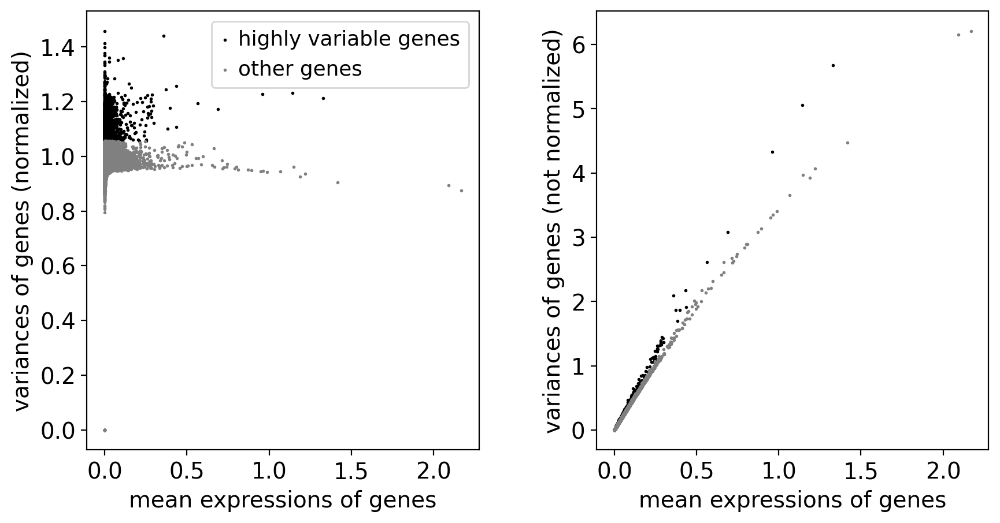

,means,variances,variances_norm,highly_variable,gene
LBHD2,0.000024,0.000153,1.456949,True,LBHD2
IGKC,0.359440,2.088533,1.439601,True,IGKC
LYPD2,0.000022,0.000141,1.412782,True,LYPD2
ZCCHC13,0.000023,0.000139,1.397672,True,ZCCHC13
NPBWR1,0.000022,0.000133,1.377659,True,NPBWR1
MRAP,0.000102,0.000626,1.368080,True,MRAP
RETNLB,0.000022,0.000133,1.367438,True,RETNLB
IGHG3,0.026246,0.154704,1.359798,True,IGHG3
IGHG1,0.111991,0.644758,1.357082,True,IGHG1
IGHA1,0.081618,0.470018,1.350923,True,IGHA1


Data for embeddings: 536,626 bins × 3,000 HVGs


In [11]:
# --- Identify Highly Variable Genes (HVGs) ---

# Identify highly variable genes using variance modeling (Seurat v3 method)
sc.pp.highly_variable_genes(
    adata_run,
    n_top_genes=3000,
    flavor="seurat_v3",   # Robust, variance-based model used in Seurat v3
    subset=False
)

# --- Summary ---
hvg_n = int(adata_run.var["highly_variable"].sum())
print(f"✅ Identified {hvg_n:,} highly variable genes (top 3,000 by variance).")

# --- Plot mean–variance relationship ---
sc.pl.highly_variable_genes(adata_run)

# --- Create a ranked HVG table ---
cols_available = [c for c in ["means", "variances", "variances_norm", "highly_variable"] if c in adata_run.var.columns]

hvg_table = (
    adata_run.var.loc[:, cols_available]
    .assign(gene=adata_run.var_names)
    .sort_values(
        by="variances_norm" if "variances_norm" in adata_run.var.columns else "variances",
        ascending=False
    )
)

# --- Display top 25 HVGs for inspection ---
display(hvg_table.head(25))

# --- Create reduced object with only HVGs ---
adata_hvg = adata_run[:, adata_run.var["highly_variable"]].copy()
print(f"Data for embeddings: {adata_hvg.n_obs:,} bins × {adata_hvg.n_vars:,} HVGs")

<div style="border:2px solid #d9534f; border-radius:8px; padding:12px; background-color:#fff5f5;">

### 🧠 Reflection — Inspecting HVGs

**Q1.** Do the top HVGs include genes you’d expect to vary spatially in this tissue (e.g., epithelial, stromal, or immune markers)?  
<details>
<summary>💬 Click to reveal answer</summary>

Yes — in this **Visium HD breast cancer** sample, many HVGs are **immunoglobulin genes** such as  
**IGKC**, **IGHG1**, **IGHG3**, **IGHA1**, and **JCHAIN**,  
which indicate **B-cell and plasma-cell–rich immune infiltrates** within the tumor microenvironment.  
Other HVGs like **ADIPOQ** reflect **adipose or stromal components**,  
showing that both immune and connective tissue regions drive major expression variability.
</details>

---

**Q2.** How might changing the number of HVGs (e.g., 1 000 vs 5 000) affect PCA, UMAP, and clustering in this dataset?  
<details>
<summary>💬 Click to reveal answer</summary>

Using fewer HVGs (≈ 1 000) emphasizes the most dominant spatial programs  
(e.g., immune infiltration vs tumor core), but may overlook finer structural variation.  
Using more HVGs (≈ 5 000) captures subtler expression differences  
but adds noise and computational cost. Around **3 000 HVGs** provides a balanced choice for this dataset.
</details>

</div>


## 🧭 Part 5 — Reduce dimensionality and explore structure (PCA & embedding)

*Learning goal → Use PCA to summarize gene-expression variation, and build a quick UMAP + Leiden clustering to visualize spatial domains.*

After selecting **Highly Variable Genes (HVGs)**, we now compress the dataset into a smaller set of  
components that capture the dominant biological variation across the tissue.

We’ll apply **Principal Component Analysis (PCA)** to summarize these expression patterns and then  
use **UMAP** and **Leiden clustering** to reveal relationships and spatially coherent domains.

---

### Why reduce dimensionality?

- Each bin has expression data for thousands of genes → too high-dimensional for direct visualization.  
- **PCA** identifies a few *orthogonal axes* (principal components) capturing the largest sources of variation.  
- These components provide a compact representation for downstream clustering and embedding.  

> PCA efficiently summarizes complex expression patterns while preserving key biological signals.

Running PCA on highly variable genes...


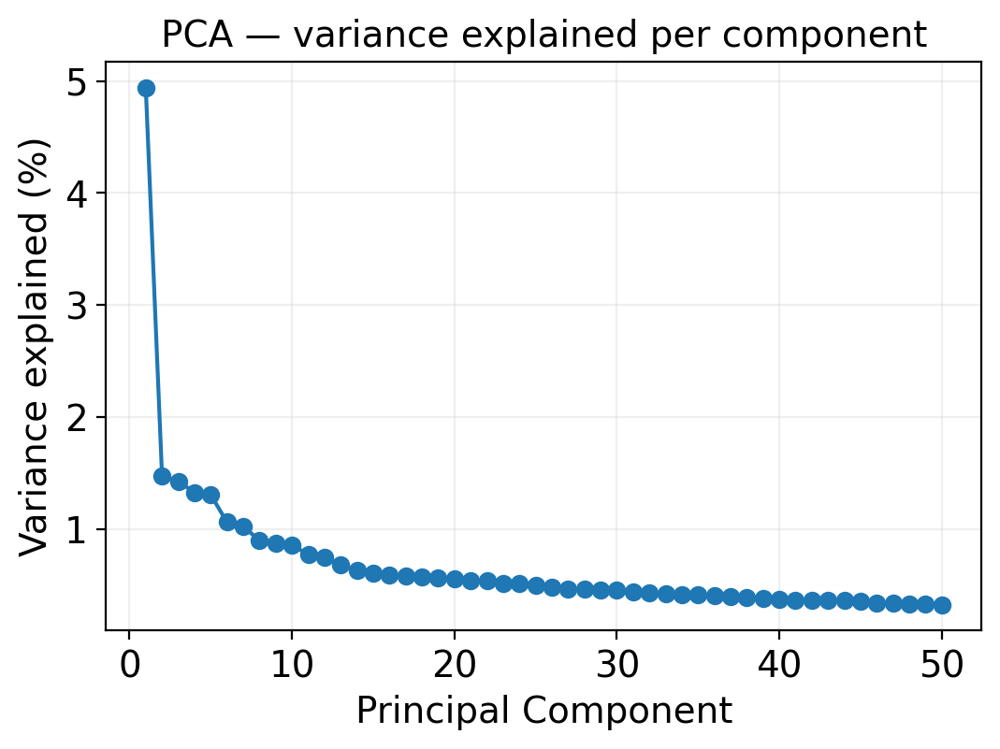

✅ PCA complete — 50 PCs computed.
50 PCs explain 90% of the total variance.


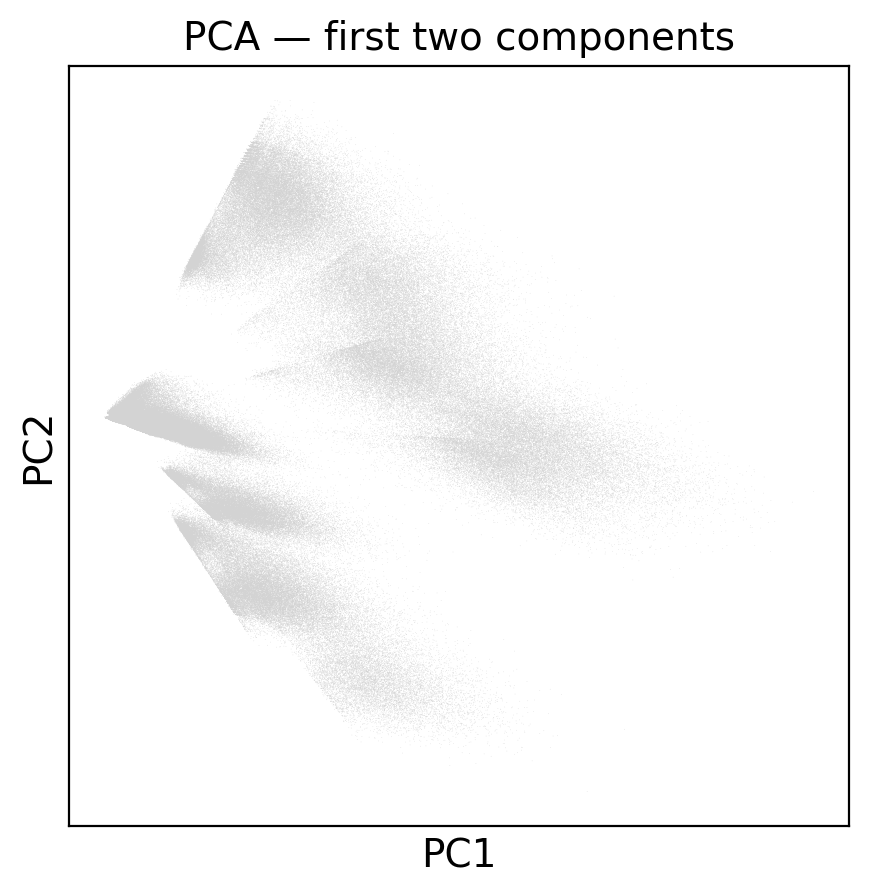

In [12]:
# --- Run PCA on highly variable genes ---
print("Running PCA on highly variable genes...")

sc.tl.pca(adata_hvg, svd_solver="arpack")

# --- Inspect explained variance ---
var_exp = adata_hvg.uns["pca"]["variance_ratio"]
n_pcs = len(var_exp)

plt.figure(figsize=(6, 4))
plt.plot(range(1, n_pcs + 1), 100 * var_exp, marker="o")
plt.title("PCA — variance explained per component")
plt.xlabel("Principal Component")
plt.ylabel("Variance explained (%)")
plt.grid(alpha=0.3)
plt.show()

# --- Scree summary ---
cumulative = 100 * pd.Series(var_exp).cumsum()
elbow = (cumulative < 90).sum() + 1
elbow = min(elbow, n_pcs)

print(f"✅ PCA complete — {n_pcs} PCs computed.")
print(f"{elbow} PCs explain 90% of the total variance.")

# --- Optional: visualize the first two PCs ---
sc.pl.pca_scatter(adata_hvg, color=None, title="PCA — first two components")

<div style="border:2px solid #d9534f; border-radius:8px; padding:12px; background-color:#fff5f5;">

### 🧠 Reflection — Interpreting PCA patterns

**Q1.** Why do only the first few PCs explain most of the variance?  
<details>
<summary>💬 Click to reveal answer</summary>
Because PCA captures the **largest global differences first** — broad biological contrasts such as  
**tumor vs stroma** or **epithelial vs immune regions** — while later PCs represent smaller,  
more specific transcriptional programs. This rapid variance drop is expected for spatial transcriptomics data.
</details>

---

**Q2.** The PCA scatter doesn’t show clear clusters. What does that suggest?  
<details>
<summary>💬 Click to reveal answer</summary>
That variation across the tissue is **continuous rather than discrete**,  
reflecting gradual changes in cell composition or microenvironment.  
We’ll visualize these smoother transitions more clearly using **UMAP**.
</details>

---

**Q3.** Why might PCA components not align directly with visible tissue regions yet?  
<details>
<summary>💬 Click to reveal answer</summary>
Because PCA summarizes **gene-level covariance**, not spatial position.  
We’ll soon combine PCA with **graph-based clustering** and the **spatial layout**  
to reveal biologically coherent domains across the tissue.
</details>

</div>


### From PCA to UMAP, clustering, and spatial mapping

Now that we’ve computed **Principal Component Analysis (PCA)**,  
we can interpret what those components represent and use them to uncover **spatial transcriptional patterns**.

---

### Understanding PCA results

PCA reduces thousands of genes into a smaller set of **principal components (PCs)**  
that summarize the main axes of biological variation across the tissue.

Each PC captures a **coordinated gene-expression program** —  
for example, one PC might separate **tumor epithelium** from **stroma**,  
while another reflects **immune infiltration** or **extracellular matrix composition**.

The **variance-explained** (or “elbow”) plot shows how much of the total variation  
each PC contributes:

- The **first few PCs** capture the major biological differences.  
- After the “elbow,” additional PCs mostly represent noise or minor effects.  

---

### How many PCs should we use?

When we ran PCA, we computed **50 components** to inspect how much variance each one explains.  
This does *not* mean we’ll use all 50 in later steps.

The variance-explained (“elbow”) plot helps decide how many PCs capture real biological signal:

- The curve drops sharply for the first few components and then **flattens around 30**.  
- This “elbow” marks the point where additional PCs add little new information.  
- We therefore use **≈ 30 PCs** for neighborhood graph construction, clustering, and UMAP.

> 💡 Computing 50 PCs provides flexibility for inspection,  
> but only the **first ~30** carry strong biological signal.  
> Using too few may miss subtle variation; using too many can add noise.

---

### From PCA to neighborhood graphs

Each spatial bin is now represented by its **PCA coordinates** —  
a compact fingerprint of its transcriptomic profile.

We use these PCs to:
1. Build a **k-nearest neighbor (kNN)** graph linking transcriptionally similar bins.  
2. Apply **Leiden clustering** to identify coherent transcriptional domains.  
3. Generate a **UMAP embedding** to visualize relationships between clusters.  
4. Map those clusters back onto the tissue image to inspect spatial organization.

> 💡 **Key idea:** PCA simplifies the data; Leiden and UMAP reveal structure;  
> spatial mapping reconnects it to histology.

---

### What is Leiden clustering?

Leiden clustering detects **communities** in a graph — groups of bins more connected  
to each other than to the rest of the tissue.  
It is based on **network modularity optimization**, aiming to find partitions  
that maximize within-cluster similarity.

- Works directly on the **kNN graph** created from PCA space.  
- Is **unsupervised** — it doesn’t need predefined labels.  
- Produces clusters that often correspond to **spatial or cell-type domains**.

The **resolution parameter** (`resolution=0.5`) controls **cluster granularity**:
- Lower values → fewer, larger clusters (coarser regions).  
- Higher values → more, smaller clusters (finer segmentation).  

> 💬 *Tip:* Adjust the resolution interactively to see how the spatial domains split or merge.

---

### Alternative clustering approaches

Leiden is popular because it’s robust, scalable, and integrated into **Scanpy**,  
but other methods exist:

| Method | Description | When to use |
|:--|:--|:--|
| **Louvain** | Older modularity-based algorithm (predecessor of Leiden). | Simple, fast, produces similar results. |
| **K-means** | Assigns clusters by centroid proximity in PCA space. | For continuous or non-graph data. |
| **Hierarchical clustering** | Builds nested, tree-like groupings. | When you want cluster relationships. |
| **Gaussian Mixture Models (GMM)** | Probabilistic, assumes Gaussian-shaped clusters. | For modeling continuous variation. |

For spatial transcriptomics, **Leiden** offers a strong balance of  
**speed, interpretability, and biological coherence**,  
making it ideal for both teaching and exploratory analysis.

---

### Why we use a subset for UMAP and clustering

The Visium HD dataset contains over **600 000 bins**.  
To make the process interactive and efficient, we’ll use a **random subset**  
of about **50 000 bins** for UMAP and clustering.  
This subset still preserves the overall spatial structure  
while making the analysis much faster.

> 🧩 All normalization, HVG selection, and PCA were performed on the **full filtered dataset** (`adata_hvg`).  
> The **subset (`adata_sub`)** is used only for embedding and clustering visualization.

In [13]:
# --- Deterministic subset for UMAP/Leiden (simple & reproducible) ---
import numpy as np

SEED = 42
N_SUBSET = 50_000

rng = np.random.default_rng(SEED)
if adata_hvg.n_obs > N_SUBSET:
    subset_idx = rng.choice(adata_hvg.n_obs, N_SUBSET, replace=False)
else:
    subset_idx = np.arange(adata_hvg.n_obs)

adata_sub = adata_hvg[subset_idx].copy()

# --- Record reproducibility info and keep a readable name ---
adata_hvg.uns["subset_seed"] = SEED
adata_hvg.uns["subset_idx"] = subset_idx
adata_sub.uns["dataset_name"] = adata_hvg.uns.get("dataset_name", "Dataset")

print(f"📉 Subset for teaching UMAP: {adata_sub.n_obs:,}/{adata_hvg.n_obs:,} bins (seed={SEED})")

📉 Subset for teaching UMAP: 50,000/536,626 bins (seed=42)


---

### Build graph, UMAP, and Leiden clustering

With our reproducible subset (`adata_sub`) ready,  
we now construct a **k-nearest neighbor (kNN)** graph from the top principal components  
to capture transcriptional similarity between spatial bins.

We’ll then:
1. Compute a **UMAP** embedding to visualize the manifold structure in 2D.  
2. Run **Leiden clustering** to detect transcriptionally coherent tissue domains.  
3. Visualize both the **UMAP clusters** and their **spatial organization** on the slide.

> 💡 Using ~30 PCs balances detail and noise — it captures major biological variation  
> (tumor, stroma, immune regions) without overfitting minor technical variation.

---

✅ UMAP & Leiden clustering complete — found 17 clusters.
   (Built using PCA-reduced data from HVGs: adata_sub.obsm['X_pca'])


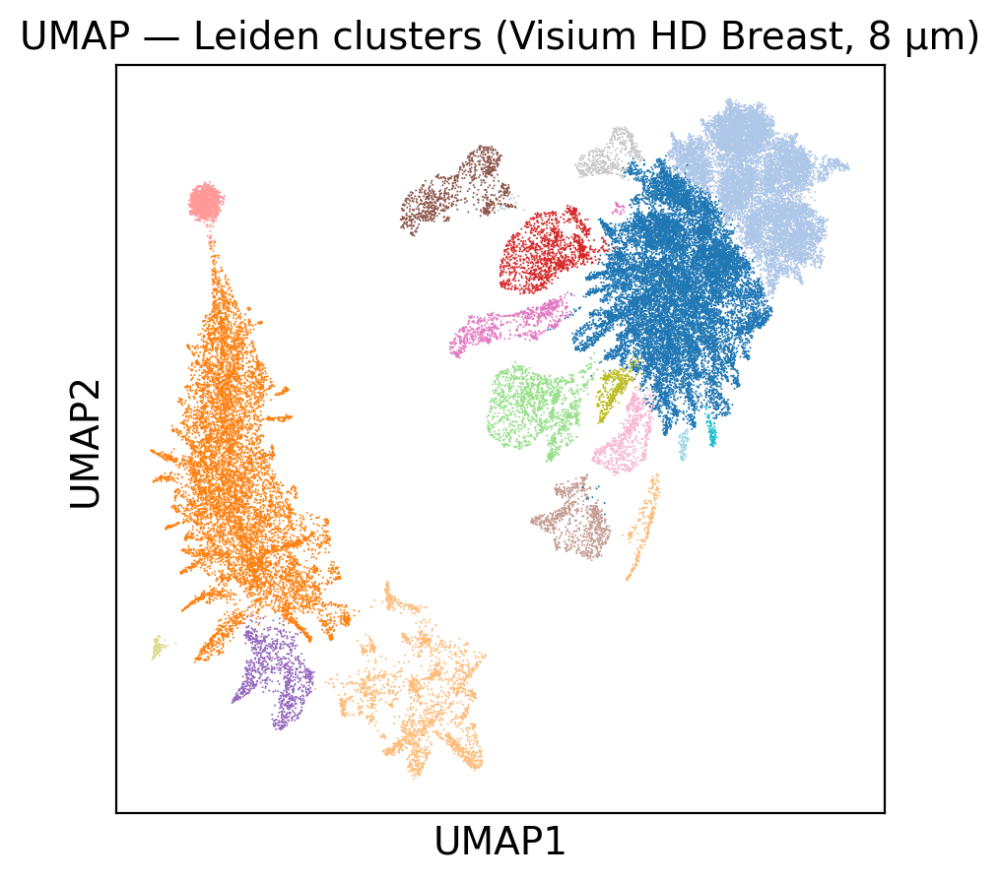

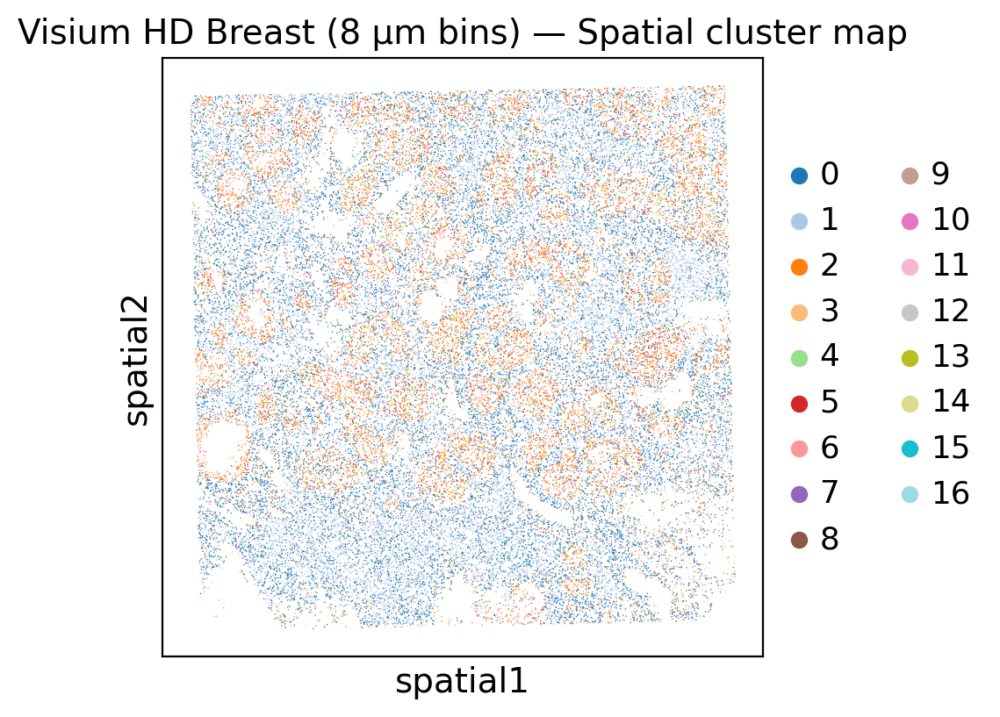

In [14]:
# --- Build neighborhood graph from first 30 PCs ---
sc.pp.neighbors(adata_sub, n_neighbors=20, n_pcs=30, random_state=SEED)

# --- Compute UMAP embedding ---
sc.tl.umap(adata_sub, random_state=SEED)

# --- Leiden clustering ---
sc.tl.leiden(adata_sub, resolution=0.2)

# --- Summary ---
n_clusters = adata_sub.obs["leiden"].nunique()
print(f"✅ UMAP & Leiden clustering complete — found {n_clusters} clusters.")
print("   (Built using PCA-reduced data from HVGs: adata_sub.obsm['X_pca'])")

# --- Plot 1: UMAP embedding ---
sc.pl.umap(
    adata_sub,
    color="leiden",
    palette="tab20",
    size=2,
    legend_loc=None,
    title="UMAP — Leiden clusters (Visium HD Breast, 8 µm)",
)

# --- Plot 2: Spatial cluster map ---
sq.pl.spatial_scatter(
    adata_sub,
    color="leiden",
    img=False,
    size=2.0,
    alpha=1.0,
    title=f"{adata_sub.uns.get('dataset_name', 'Dataset')} — Spatial cluster map",
)


<div style="border:2px solid #d9534f; border-radius:8px; padding:12px; background-color:#fff5f5;">

### 🧠 Reflection — UMAP and clustering

**Q1.** Why do we perform UMAP and clustering on a *subset* rather than all 600 000 bins?  
<details><summary>💬 Click to reveal answer</summary>
Because building the full kNN graph is computationally intensive.  
Using a random subset (~50 000 bins) keeps the workflow interactive  
while preserving the global spatial structure.  
For full-resolution analyses, the same procedure can be scaled up on a high-memory workstation.
</details>

---

**Q2.** What happens if we use too few PCs or too few HVGs before this step?  
<details><summary>💬 Click to reveal answer</summary>
We may miss important sources of variation — clusters can merge or lose biological meaning.  
Choosing around **30 PCs** and **3 000 HVGs** strikes a balance between speed and biological signal.
</details>

---

**Q3.** What does the Leiden algorithm actually cluster, and why do we use a kNN graph?  
<details><summary>💬 Click to reveal answer</summary>
Leiden detects **communities** in a graph where each node (bin) connects  
to its **nearest neighbors in PCA space**.  
This allows clusters to follow **natural, non-spherical** biological shapes  
that simple methods like k-means might miss.
</details>

---

**Q4.** How does the *resolution* parameter affect biological interpretation?  
<details><summary>💬 Click to reveal answer</summary>
Higher resolution produces **more, smaller clusters** revealing substructures,  
while lower resolution merges them into **broader domains**.  
Choosing the right value depends on whether you want fine-grained or global spatial patterns.
</details>

</div>


---

## 🧾 Summary — What you accomplished

In this practical, you’ve walked through the **core preprocessing workflow** for  
sequencing-based spatial transcriptomics (Visium HD) data — from raw counts to interpretable structure.

You learned to:

1. **Load and inspect** Space Ranger HD output and confirm correct tissue alignment.  
2. **Compute and visualize QC metrics** (total counts, detected genes, % mitochondrial).  
3. **Filter low-quality bins** while keeping biologically meaningful spatial regions.  
4. **Normalize gene expression** and select **Highly Variable Genes (HVGs)** that capture key spatial variation.  
5. **Reduce dimensionality** using **PCA**, and visualize structure with **UMAP and Leiden clustering**.  

> 💡 You’ve now produced a biologically interpretable, spatially consistent dataset —  
> ready for downstream exploration such as identifying spatial domains, marker genes,  
> or gene co-expression networks.

---

## 🔭 What’s next?

The following steps would extend this analysis toward **biological interpretation**:

| Goal | Example methods / tools | Key insight |
|:--|:--|:--|
| **Annotate clusters** | `sc.tl.rank_genes_groups()` to find marker genes per Leiden cluster | Identify dominant cell types or tissue regions |
| **Visualize marker expression spatially** | `sq.pl.spatial_scatter(adata_sub, color=["COL1A1","IGKC"])` | Confirm spatial domains (stroma, immune, tumor) |
| **Integrate histology** | Combine with `squidpy.im.calculate_texture()` or `sq.gr.co_occurrence()` | Explore spatial correlation with morphology |
| **Compute spatial statistics** | Moran’s I, Ripley’s K, spatial autocorrelation | Quantify how structured gene expression is |
| **Integrate multiple sections or modalities** | Align with scRNA-seq or adjacent tissue | Build multimodal maps and cross-sample comparisons |

> 🧠 *From here, you can move from preprocessing to **biological discovery**,  
> linking transcriptomic variation directly to tissue structure.*

---

### ✅ End of Practical 4

You’ve now completed **Practical 4 — Sequence-based Spatial Transcriptomics Analysis**.  
Your processed `adata` object is analysis-ready and can serve as the foundation  
for domain identification, cell type mapping, and integrative spatial studies.